In [321]:
import pandas as pd #For reading dataset files
import networkx as nx #For network creation/analysis
import matplotlib.pyplot as plt #For plotting graphs
import numpy as np
import igraph as ig
from networkx.algorithms import community
from community import community_louvain as community_louvain
from pandas import DataFrame

%matplotlib inline

In [322]:
data = pd.read_excel('eurovision_song_contest_1975_2019.xlsx')

# Preprocessing

In [325]:
# recoding points
data = data[(data['(semi-) final']) == 'f']
data['Points      '] = np.where(data['Points      '] == 10, 9, data['Points      '])
data['Points      '] = np.where(data['Points      '] == 12, 10, data['Points      '])

# making dinctinct datasets
data_1980 = data[(data['Year']) == 1980]
data_1980 = data_1980[(data['Points      ']) != 0]
data_1980 = data_1980[['From country', 'To country', 'Points      ']]
data_1980 = data_1980.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_1980 = data_1980['weight']

data_1990 = data[(data['Year']) == 1990]
data_1990 = data_1990[(data['Points      ']) != 0]
data_1990 = data_1990[['From country', 'To country', 'Points      ']]
data_1990 = data_1990.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_1990 = data_1990['weight']


data_2000 = data[(data['Year']) == 2000]
data_2000 = data_2000[(data['Points      ']) != 0]
data_2000 = data_2000[['From country', 'To country', 'Points      ']]
data_2000 = data_2000.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2000 = data_2000['weight']

data_2010 = data[(data['Year']) == 2010]
data_2010 = data_2010[(data['Points      ']) != 0]
data_2010 = data_2010[['From country', 'To country', 'Points      ']]
data_2010 = data_2010.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2010 = data_2010['weight']

data_2019 = data[(data['Year']) == 2019]
data_2019 = data_2019[(data['Points      ']) != 0]
data_2019_T = data_2019[(data_2019['Jury or Televoting'] == 'T')]
data_2019_T = data_2019[['From country', 'To country', 'Points      ']]
data_2019_T = data_2019.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


In [326]:
# making distinct datasets for jury voting and televoting
data_2016 = data[(data['Year']) == 2016]
data_2016 = data_2016[(data['Points      ']) != 0]
data_2016_T = data_2016[(data_2016['Jury or Televoting'] == 'T')]
data_2016_J = data_2016[(data_2016['Jury or Televoting'] == 'J')]
data_2016_T = data_2016_T[['From country', 'To country', 'Points      ']]
data_2016_T = data_2016_T.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
data_2016_J = data_2016_J[['From country', 'To country', 'Points      ']]
data_2016_J = data_2016_J.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2016_T = data_2016_T['weight']
weights_2016_J = data_2016_J['weight']

data_2017 = data[(data['Year']) == 2017]
data_2017 = data_2017[(data['Points      ']) != 0]
data_2017_T = data_2017[(data_2017['Jury or Televoting'] == 'T')]
data_2017_J = data_2017[(data_2017['Jury or Televoting'] == 'J')]
data_2017_T = data_2017_T[['From country', 'To country', 'Points      ']]
data_2017_T = data_2017_T.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
data_2017_J = data_2017_J[['From country', 'To country', 'Points      ']]
data_2017_J = data_2017_J.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2017_T = data_2017_T['weight']
weights_2017_J = data_2017_J['weight']

data_2018 = data[(data['Year']) == 2018]
data_2018 = data_2018[(data['Points      ']) != 0]
data_2018_T = data_2018[(data_2018['Jury or Televoting'] == 'T')]
data_2018_J = data_2018[(data_2018['Jury or Televoting'] == 'J')]
data_2018_T = data_2018_T[['From country', 'To country', 'Points      ']]
data_2018_T = data_2018_T.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
data_2018_J = data_2018_J[['From country', 'To country', 'Points      ']]
data_2018_J = data_2018_J.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2018_T = data_2018_T['weight']
weights_2018_J = data_2018_J['weight']

data_2019 = data[(data['Year']) == 2019]
data_2019 = data_2019[(data['Points      ']) != 0]
data_2019_T = data_2019[(data_2019['Jury or Televoting'] == 'T')]
data_2019_J = data_2019[(data_2019['Jury or Televoting'] == 'J')]
data_2019_T = data_2019_T[['From country', 'To country', 'Points      ']]
data_2019_T = data_2019_T.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
data_2019_J = data_2019_J[['From country', 'To country', 'Points      ']]
data_2019_J = data_2019_J.rename(columns = {'From country': 'from', 'To country': 'to', 'Points      ': 'weight'})
weights_2019_T = data_2019_T['weight']
weights_2019_J = data_2019_J['weight']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


# Description of data

In [331]:
import matplotlib
#print(data_2016_J['from'].unique())
print('The number of countries: ', len(data_1980['from'].unique()))
print('The number of countries: ', len(data_1990['from'].unique()))
print('The number of countries: ', len(data_2000['from'].unique()))
print('The number of countries: ', len(data_2010['from'].unique()))
print('The number of countries: ', len(data_2016_T['from'].unique()))
print('The number of countries: ', len(data_2017_T['from'].unique()))
print('The number of countries: ', len(data_2018_T['from'].unique()))
print('The number of countries: ', len(data_2019_T['from'].unique()))


The number of countries:  19
The number of countries:  22
The number of countries:  24
The number of countries:  39
The number of countries:  42
The number of countries:  42
The number of countries:  43
The number of countries:  41


# Graphs undirected


In [332]:
# from 1980 to 2010
G_1980 = nx.from_pandas_edgelist(data_1980, source='from', target='to',edge_attr=True)
G_1990 = nx.from_pandas_edgelist(data_1990, source='from', target='to',edge_attr=True)
G_2000 = nx.from_pandas_edgelist(data_2000, source='from', target='to',edge_attr=True)
G_2010 = nx.from_pandas_edgelist(data_2010, source='from', target='to',edge_attr=True)

G_2016_T = nx.from_pandas_edgelist(data_2016_T, source='from', target='to',edge_attr=True)
G_2017_T = nx.from_pandas_edgelist(data_2017_T, source='from', target='to',edge_attr=True)
G_2018_T = nx.from_pandas_edgelist(data_2018_T, source='from', target='to',edge_attr=True)
G_2019_T = nx.from_pandas_edgelist(data_2019_T, source='from', target='to',edge_attr=True)

G_2016_J = nx.from_pandas_edgelist(data_2016_J, source='from', target='to',edge_attr=True)
G_2017_J = nx.from_pandas_edgelist(data_2017_J, source='from', target='to',edge_attr=True)
G_2018_J = nx.from_pandas_edgelist(data_2018_J, source='from', target='to',edge_attr=True)
G_2019_J = nx.from_pandas_edgelist(data_2019_J, source='from', target='to',edge_attr=True)

In [335]:
print(G_1980)
print(G_1990)
print(G_2000)
print(G_2010)
print('')

print(G_2016_T)
print(G_2017_T)
print(G_2018_T)
print(G_2019_T)
print('')

print(G_2016_J)
print(G_2017_J)
print(G_2018_J)
print(G_2019_J)

Graph with 19 nodes and 141 edges
Graph with 22 nodes and 167 edges
Graph with 24 nodes and 179 edges
Graph with 39 nodes and 327 edges

Graph with 42 nodes and 359 edges
Graph with 42 nodes and 363 edges
Graph with 44 nodes and 371 edges
Graph with 41 nodes and 317 edges

Graph with 42 nodes and 355 edges
Graph with 42 nodes and 363 edges
Graph with 44 nodes and 383 edges
Graph with 41 nodes and 316 edges


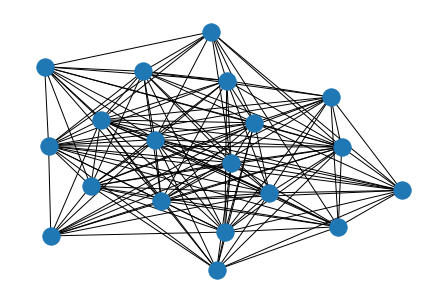

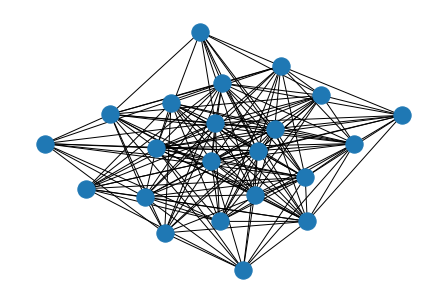

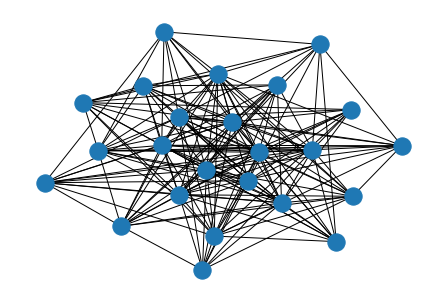

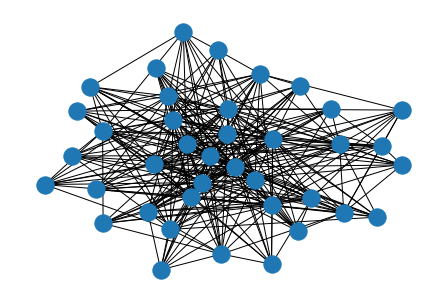

In [413]:
plt.figure(1)
nx.draw(G_1980)
plt.figure(2)
nx.draw(G_1990)
plt.figure(3)
nx.draw(G_2000)
plt.figure(4)
nx.draw(G_2010)

plt.show()

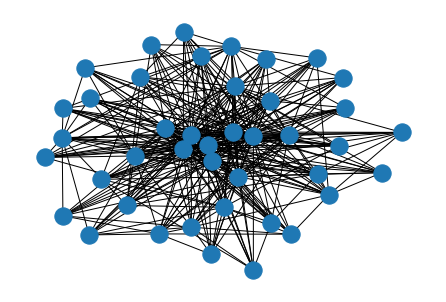

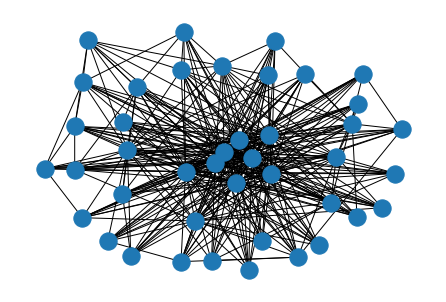

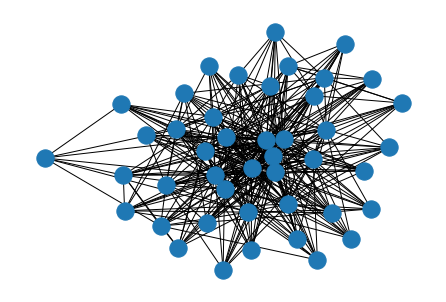

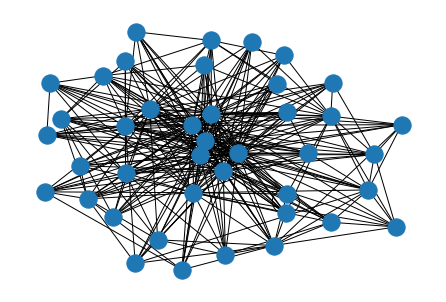

In [414]:
plt.figure(1)
nx.draw(G_2016_T)
plt.figure(2)
nx.draw(G_2017_T)
plt.figure(3)
nx.draw(G_2018_T)
plt.figure(4)
nx.draw(G_2019_T)

plt.show()

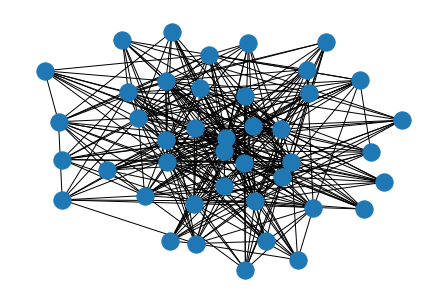

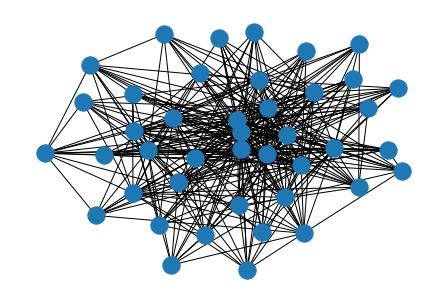

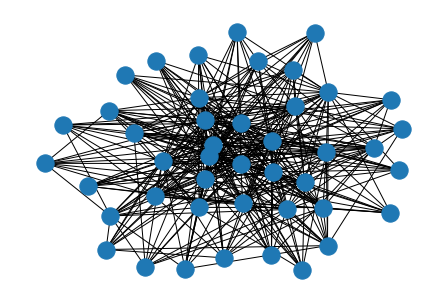

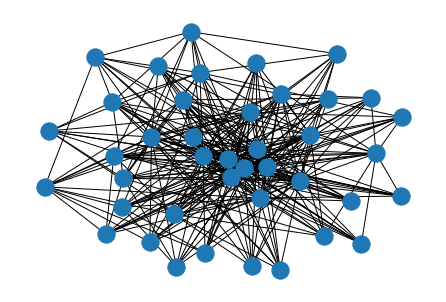

In [415]:
plt.figure(1)
nx.draw(G_2016_J)
plt.figure(2)
nx.draw(G_2017_J)
plt.figure(3)
nx.draw(G_2018_J)
plt.figure(4)
nx.draw(G_2019_J)

plt.show()

## Degrees

(array([3., 4., 3., 1., 1., 2., 2., 0., 2., 1.]),
 array([ 55.,  61.,  67.,  73.,  79.,  85.,  91.,  97., 103., 109., 115.]),
 <a list of 10 Patch objects>)

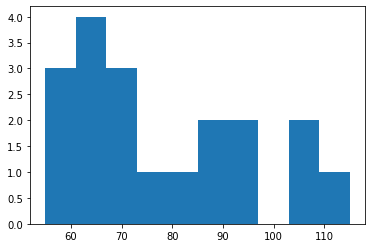

In [339]:
degrees = [G_1980.degree(n, weight='weight') for n in G_1980.nodes()]
plt.hist(degrees)

(array([5., 2., 5., 3., 1., 0., 2., 1., 1., 2.]),
 array([ 50.,  59.,  68.,  77.,  86.,  95., 104., 113., 122., 131., 140.]),
 <a list of 10 Patch objects>)

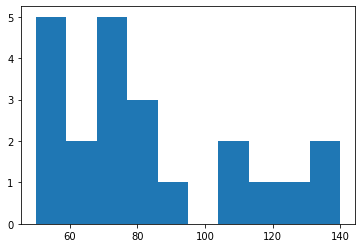

In [340]:
degrees = [G_1990.degree(n, weight='weight') for n in G_1990.nodes()]
plt.hist(degrees)

(array([10.,  2.,  3.,  2.,  1.,  4.,  0.,  1.,  0.,  1.]),
 array([ 51. ,  62.3,  73.6,  84.9,  96.2, 107.5, 118.8, 130.1, 141.4,
        152.7, 164. ]),
 <a list of 10 Patch objects>)

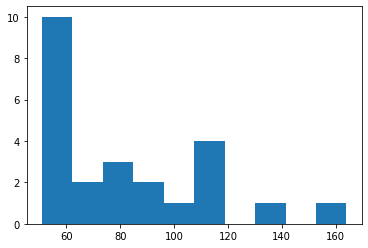

In [341]:
degrees = [G_2000.degree(n, weight='weight') for n in G_2000.nodes()]
plt.hist(degrees)

(array([17.,  7.,  1.,  4.,  1.,  4.,  3.,  1.,  0.,  1.]),
 array([ 49. ,  65.4,  81.8,  98.2, 114.6, 131. , 147.4, 163.8, 180.2,
        196.6, 213. ]),
 <a list of 10 Patch objects>)

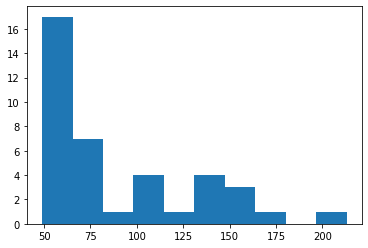

In [342]:
degrees = [G_2010.degree(n, weight='weight') for n in G_2010.nodes()]
plt.hist(degrees)

(array([24.,  7.,  2.,  4.,  0.,  2.,  1.,  0.,  1.,  1.]),
 array([ 49. ,  74.3,  99.6, 124.9, 150.2, 175.5, 200.8, 226.1, 251.4,
        276.7, 302. ]),
 <a list of 10 Patch objects>)

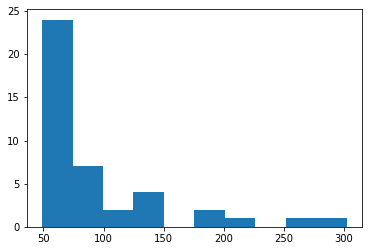

In [343]:
degrees = [G_2016_T.degree(n, weight='weight') for n in G_2016_T.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2017_T.degree(n, weight='weight') for n in G_2017_T.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2018_T.degree(n, weight='weight') for n in G_2018_T.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2019_T.degree(n, weight='weight') for n in G_2019_T.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2016_J.degree(n, weight='weight') for n in G_2016_J.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2017_J.degree(n, weight='weight') for n in G_2017_J.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2018_J.degree(n, weight='weight') for n in G_2018_J.nodes()]
plt.hist(degrees)

In [ ]:
degrees = [G_2019_J.degree(n, weight='weight') for n in G_2019_J.nodes()]
plt.hist(degrees)

## Closeness centrality

In [401]:
def cent_cl(graph):
  G_distance_dict = {(e1, e2): 1 / weight for e1, e2, weight in graph.edges(data='weight')}
  nx.set_edge_attributes(graph, G_distance_dict, 'distance')
  print(nx.closeness_centrality(graph, distance='distance'))

cent_cl(G_1990)
cent_cl(G_2000)
cent_cl(G_2010)

cent_cl(G_2016_T)
cent_cl(G_2017_T)
cent_cl(G_2018_T)
cent_cl(G_2019_T)

cent_cl(G_2016_J)
cent_cl(G_2017_J)
cent_cl(G_2018_J)
cent_cl(G_2019_J)

{'Austria': 4.962490622655663, 'Belgium': 5.120959938068511, 'Denmark': 4.681528662420382, 'France': 6.340002396070443, 'Germany': 4.98868778280543, 'Iceland': 5.703200775945684, 'Ireland': 5.9816887080366214, 'Italy': 6.415323069462964, 'Luxembourg': 4.972282251244948, 'Spain': 5.5286251567070614, 'United Kingdom': 5.765333914369756, 'Cyprus': 4.6765641569459175, 'Greece': 4.67615092338959, 'Switzerland': 5.238048104523409, 'The Netherlands': 4.826705581904413, 'Yugoslavia': 5.0505821721702615, 'Norway': 4.796084828711255, 'Finland': 4.729645187237464, 'Israel': 4.299642508937277, 'Sweden': 5.0237326751471425, 'Turkey': 4.479810378396682, 'Portugal': 4.709022957821675}
{'Austria': 4.626067523345837, 'Croatia': 5.147881694644284, 'Denmark': 7.089908256880732, 'Estonia': 5.320848251170475, 'Germany': 5.5163224516988665, 'Ireland': 5.3429203539823, 'Latvia': 5.432561627144062, 'Malta': 4.958507998973394, 'Russia': 6.177787252185034, 'Switzerland': 4.814353351607275, 'Turkey': 4.894443506

## Eigenvecor centrality

In [409]:
def cent_eig(graph):
  eigenvector_centrality_weighted = nx.eigenvector_centrality(graph, weight='weight')
  for node in sorted(eigenvector_centrality_weighted, key=eigenvector_centrality_weighted.get, reverse=True):
    print(node, eigenvector_centrality_weighted[node])
  print('')

In [410]:
cent_eig(G_1980)
cent_eig(G_1990)
cent_eig(G_2000)
cent_eig(G_2010)

cent_eig(G_2016_T)
cent_eig(G_2017_T)
cent_eig(G_2018_T)
cent_eig(G_2019_T)

cent_eig(G_2016_J)
cent_eig(G_2017_J)
cent_eig(G_2018_J)
cent_eig(G_2019_J)

Germany 0.3210944091970001
United Kingdom 0.29551967658360456
Ireland 0.2931213073771181
Switzerland 0.26995275154008724
Italy 0.2562117424444781
Portugal 0.2524236035697673
The Netherlands 0.2443079600862093
Sweden 0.23743935497060717
Spain 0.22476114302916791
Luxembourg 0.2097003326707028
Turkey 0.19932800107401213
Austria 0.1958160780168094
France 0.1935263673757457
Norway 0.19324868696749448
Denmark 0.18797295775109638
Morocco 0.18726677246433976
Finland 0.18063749671489943
Belgium 0.17650806610684322
Greece 0.1542510103579249

France 0.31650035794910075
Italy 0.3110547484846195
Ireland 0.2905974490752634
Iceland 0.2706641152052139
United Kingdom 0.27033464838697435
Spain 0.24715651650639545
Switzerland 0.22157017598256953
Belgium 0.205074789939883
Yugoslavia 0.20277667415063738
Germany 0.19894821982842326
Sweden 0.19861772643526718
Denmark 0.19556871850824398
Luxembourg 0.18681764471411716
Austria 0.18610930475313
The Netherlands 0.17149828082795682
Cyprus 0.16554021333076735
Port

# Graphs directed

In [411]:
G_directed_1990 = nx.from_pandas_edgelist(data_1990, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_1980 = nx.from_pandas_edgelist(data_1980, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2000 = nx.from_pandas_edgelist(data_2000, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2010 = nx.from_pandas_edgelist(data_2010, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())

# tele
G_directed_2016_T = nx.from_pandas_edgelist(data_2016_T, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2017_T = nx.from_pandas_edgelist(data_2017_T, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2018_T = nx.from_pandas_edgelist(data_2018_T, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2019_T = nx.from_pandas_edgelist(data_2019_T, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())

# jury
G_directed_2016_J = nx.from_pandas_edgelist(data_2016_J, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2017_J = nx.from_pandas_edgelist(data_2017_J, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2018_J = nx.from_pandas_edgelist(data_2018_J, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())
G_directed_2019_J = nx.from_pandas_edgelist(data_2019_J, source='from', target='to',edge_attr=True, create_using=nx.DiGraph())

In [420]:
print(G_directed_1980)
print(G_directed_1990)
print(G_directed_2000)
print(G_directed_2010)
print('')

print(G_directed_2016_T)
print(G_directed_2017_T)
print(G_directed_2018_T)
print(G_directed_2019_T)
print('')

DiGraph with 19 nodes and 190 edges
DiGraph with 22 nodes and 220 edges
DiGraph with 24 nodes and 240 edges
DiGraph with 39 nodes and 390 edges

DiGraph with 42 nodes and 420 edges
DiGraph with 42 nodes and 420 edges
DiGraph with 44 nodes and 430 edges
DiGraph with 41 nodes and 370 edges



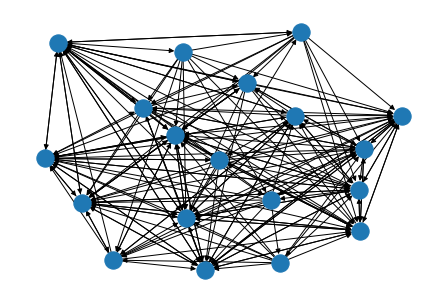

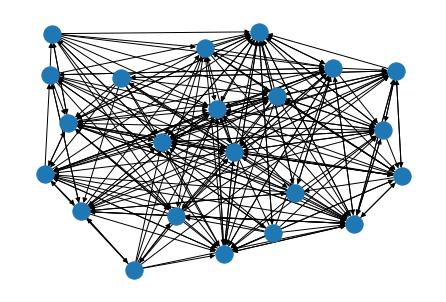

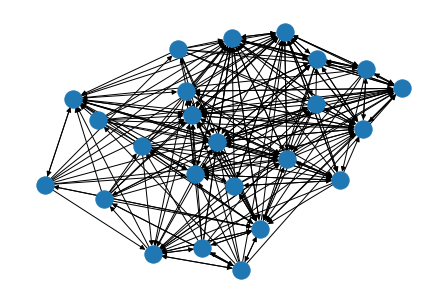

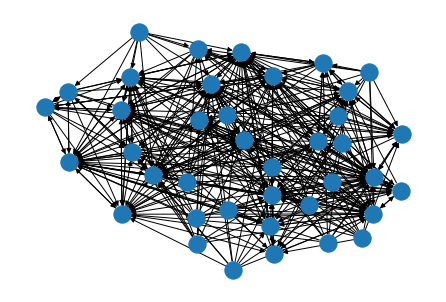

In [412]:
plt.figure(1)
nx.draw(G_directed_1980)
plt.figure(2)
nx.draw(G_directed_1990)
plt.figure(3)
nx.draw(G_directed_2000)
plt.figure(4)
nx.draw(G_directed_2010)

plt.show()

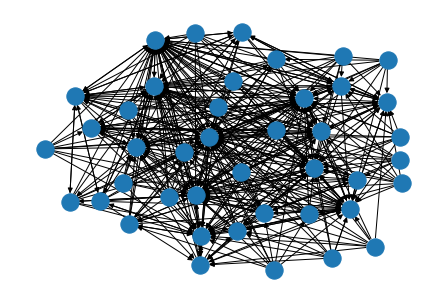

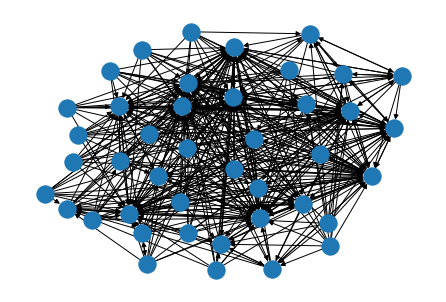

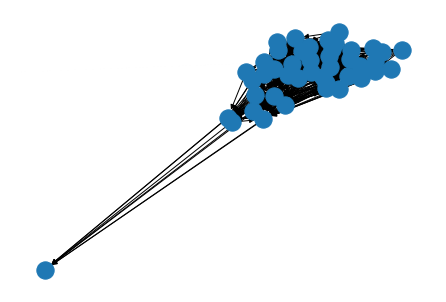

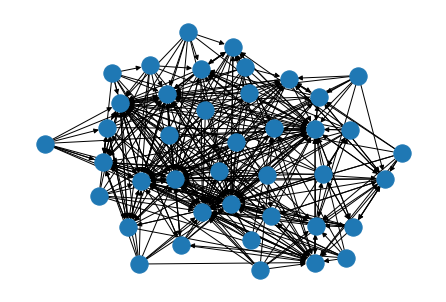

In [352]:
plt.figure(1)
nx.draw(G_directed_2016_T)
plt.figure(2)
nx.draw(G_directed_2017_T)
plt.figure(3)
nx.draw(G_directed_2018_T)
plt.figure(4)
nx.draw(G_directed_2019_T)

plt.show()

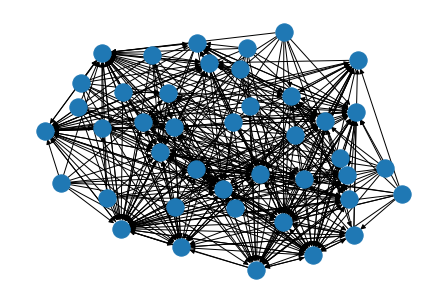

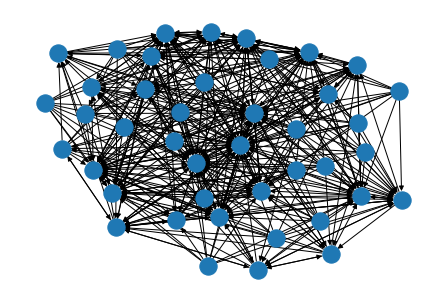

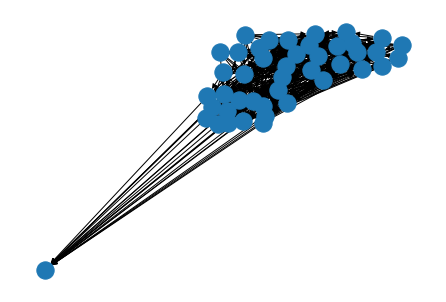

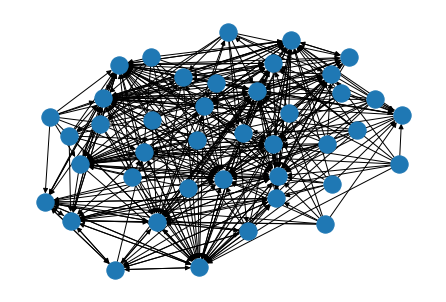

In [353]:
plt.figure(1)
nx.draw(G_directed_2016_J)
plt.figure(2)
nx.draw(G_directed_2017_J)
plt.figure(3)
nx.draw(G_directed_2018_J)
plt.figure(4)
nx.draw(G_directed_2019_J)

plt.show()

## Eigenvector centrality

In [421]:
print(nx.eigenvector_centrality(G_directed_1980, weight='weight'))
print(nx.eigenvector_centrality(G_directed_1990, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2000, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2010, weight='weight'))

print(nx.eigenvector_centrality(G_directed_2016_T, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2017_T, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2018_T, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2019_T, weight='weight'))

print(nx.eigenvector_centrality(G_directed_2016_J, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2017_J, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2018_J, weight='weight'))
print(nx.eigenvector_centrality(G_directed_2019_J, weight='weight'))

{'Austria': 0.25894113866970264,
 'Belgium': 0.05420379989463033,
 'Denmark': 0.09220223297531677,
 'Finland': 0.008801490901244179,
 'France': 0.1444739290881212,
 'Germany': 0.41034107789923685,
 'Greece': 0.1404920733820077,
 'Ireland': 0.42462168863789146,
 'Italy': 0.2800599398470149,
 'Luxembourg': 0.18464941334194201,
 'Morocco': 0.03630411970071438,
 'Norway': 0.06616119399111238,
 'Portugal': 0.24019854216400166,
 'Spain': 0.11191389034626734,
 'Sweden': 0.14400843189239157,
 'Switzerland': 0.36081263742279457,
 'The Netherlands': 0.2660072662799288,
 'Turkey': 0.06192677085983933,
 'United Kingdom': 0.3437663360858067}

# Community 

## Walktrap

In [377]:
# printing names of the graphs
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

# walktrap plot    
def walk_plot(graph, weights):
    g = ig.Graph.TupleList(graph.edges(), directed=True)
    wtrap = g.community_walktrap(steps = 3, weights = weights)
    clust = wtrap.as_clustering()
    ig.plot(clust, mark_groups = True, bbox=(300,300), vertex_label=g.vs['name'])

# walktrap
def walk(graph, weights):
    g = ig.Graph.TupleList(graph.edges(), directed=True)
    wtrap = g.community_walktrap(steps = 3, weights = weights)
    clust = wtrap.as_clustering()
    print('Clustering for', namestr(graph, globals())[0])
    print(clust)
    print('')

In [380]:
# 1980 - 2010 
walk(G_directed_1980, weights_1980)
walk(G_directed_1990, weights_1990)
walk(G_directed_2000, weights_2000)
walk(G_directed_2010, weights_2010)

Clustering for G_directed_1980
Clustering with 19 elements and 2 clusters
[0] Austria, Germany, Greece, Ireland, Italy, Luxembourg, Switzerland, The
    Netherlands, United Kingdom, Denmark, Norway, Portugal, Belgium, France,
    Finland
[1] Spain, Turkey, Sweden, Morocco

Clustering for G_directed_1990
Clustering with 22 elements and 1 clusters
[0] Austria, Belgium, Denmark, France, Germany, Iceland, Ireland, Italy,
    Luxembourg, Spain, United Kingdom, Cyprus, Norway, Switzerland,
    Yugoslavia, The Netherlands, Israel, Sweden, Turkey, Finland, Portugal,
    Greece

Clustering for G_directed_2000
Clustering with 24 elements and 3 clusters
[0] Austria, Denmark, Germany, Ireland, Latvia, Switzerland, Turkey, The
    Netherlands, Iceland, Norway, Sweden, Finland, Spain
[1] Croatia, Russia, Cyprus, F.Y.R. Macedonia, Romania
[2] Estonia, Malta, United Kingdom, France, Belgium, Israel

Clustering for G_directed_2010
Clustering with 39 elements and 3 clusters
[0] Albania, Bosnia & Herzego

In [42]:
walk_plot(G_directed_1980, weights_1980)
walk_plot(G_directed_1990, weights_1990)
walk_plot(G_directed_2000, weights_2000)
walk_plot(G_directed_2010, weights_2010)

['___', 'G_directed_1980', '_30', '_32']

In [379]:
# 2016 - 2019 televoting
walk(G_directed_2016_T, weights_2016_T)
walk(G_directed_2017_T, weights_2017_T)
walk(G_directed_2018_T, weights_2018_T)
walk(G_directed_2019_T, weights_2019_T)

Clustering for G_directed_2016_T
Clustering with 42 elements and 1 clusters
[0] Albania, Armenia, Australia, Bulgaria, Hungary, Italy, Lithuania, Poland,
    Russia, Sweden, Ukraine, Austria, Cyprus, France, Georgia, Malta, Belgium,
    Spain, United Kingdom, Azerbaijan, Israel, The Netherlands, Serbia,
    Latvia, Germany, Croatia, Belarus, Bosnia & Herzegovina, Czech Republic,
    Denmark, Estonia, F.Y.R. Macedonia, Finland, Greece, Iceland, Ireland,
    Moldova, Montenegro, Norway, San Marino, Slovenia, Switzerland

Clustering for G_directed_2017_T
Clustering with 42 elements and 2 clusters
[0] Albania, Belgium, Bulgaria, Croatia, France, Hungary, Italy, Portugal,
    Romania, Sweden, Moldova, Poland, The Netherlands, Israel, Ukraine, Spain,
    Norway, Azerbaijan, Belarus, Australia, Denmark, United Kingdom, Austria,
    Czech Republic, Estonia, F.Y.R. Macedonia, Finland, Georgia, Germany,
    Iceland, Ireland, Latvia, Lithuania, Malta, Montenegro, San Marino,
    Serbia, Slovenia,

In [ ]:
walk_plot(G_directed_2016_T, weights_2016_T)
walk_plot(G_directed_2017_T, weights_2017_T)
walk_plot(G_directed_2018_T, weights_2018_T)
walk_plot(G_directed_2019_T, weights_2019_T)

In [381]:
# 2016 - 2019 jury voting
walk(G_directed_2016_J, weights_2016_J)
walk(G_directed_2017_J, weights_2017_J)
walk(G_directed_2018_J, weights_2018_J)
walk(G_directed_2019_J, weights_2019_J)

Clustering for G_directed_2016_J
Clustering with 42 elements and 4 clusters
[0] Albania, Australia, France, Israel, Italy, Spain, United Kingdom, Belgium,
    The Netherlands, Serbia, Sweden, Denmark, Estonia, F.Y.R. Macedonia,
    Finland, Montenegro, Norway, Slovenia
[1] Bulgaria, Lithuania, Ukraine, Georgia, Latvia, Germany, Poland,
    Switzerland
[2] Hungary, Malta, Russia, Croatia, Armenia, Azerbaijan, Cyprus, Belarus,
    Bosnia & Herzegovina, Greece, Moldova, San Marino
[3] Austria, Czech Republic, Iceland, Ireland

Clustering for G_directed_2017_J
Clustering with 42 elements and 5 clusters
[0] Albania, Armenia, France, Greece, Italy, Cyprus, Georgia, Montenegro
[1] Australia, Portugal, United Kingdom, Austria, Norway, Sweden, Denmark, The
    Netherlands, Belgium, Czech Republic, Estonia, F.Y.R. Macedonia, Finland,
    Germany, Iceland, Ireland, Lithuania, Switzerland
[2] Azerbaijan, Bulgaria, Romania, Belarus, Croatia, Israel, Ukraine, Hungary,
    Malta
[3] Moldova, Latvia, 

In [ ]:
walk_plot(G_directed_2016_J, weights_2016_J)
walk_plot(G_directed_2017_J, weights_2017_J)
walk_plot(G_directed_2018_J, weights_2018_J)
walk_plot(G_directed_2019_J, weights_2019_J)

## Edge betweenness

In [441]:
def edge(graph):
  # Edge betweenness
  lst_b = nx.algorithms.community.girvan_newman(graph)

  # Modularity
  modularity = []
  for x in lst_b:
    modularity.append(community.modularity(graph, x))
  modularity

  # Community with the max modularity
  index = modularity.index(max(modularity))
  i=0
  lst_b = nx.algorithms.community.girvan_newman(graph)
  for v in lst_b:
    if i==index:
      temp = v
    i+=1

  # Community visualization 
  colors = ["#00C98D", "#5030C0", "#50F0F0", 'red', 'blue', 'pink', 'orange', '#CD1076', '#B2DFEE', '#CD00CD', '#48D1CC', '#D02090', '#EE9A49', '#60bba8', '#ed6925', '#edf8a3', '#20B2AA']
  pos = nx.spring_layout(graph)
  color_map_b = {}
  keys = graph.nodes()
  values = "black"
  for i in keys:
          color_map_b[i] = values
  counter = 0
  for x in temp:
    for n in x:
      color_map_b[n] = colors[counter]
    counter = counter + 1

  nx.draw_networkx_edges(graph, pos, alpha = 0.5)
  nx.draw_networkx_nodes(graph, pos, node_color=dict(color_map_b).values(), node_size = 400)
  nx.draw_networkx_labels(graph, pos)
  plt.axis("off")
  plt.show()

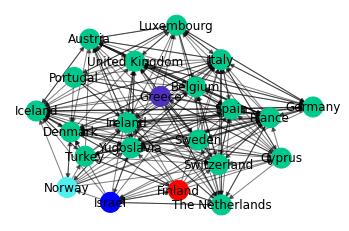

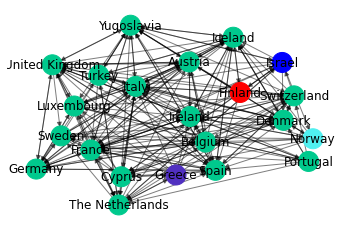

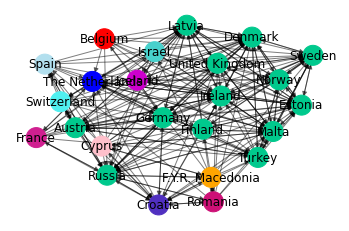

In [437]:
edge(G_directed_1990)
edge(G_directed_1990)
edge(G_directed_2000)
#edge(G_directed_2010)
# too many clusters

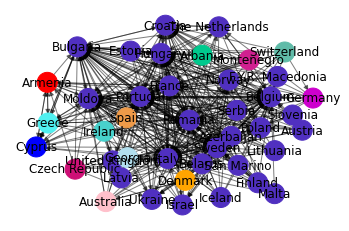

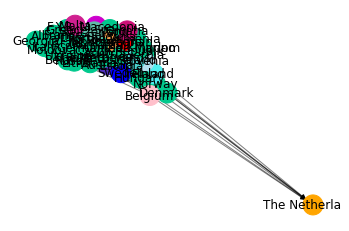

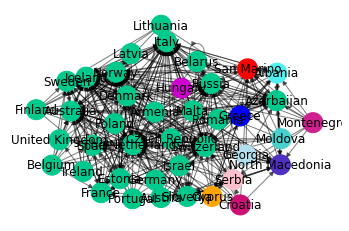

In [443]:
#edge(G_directed_2016_T)
# too many 
edge(G_directed_2017_T)
edge(G_directed_2018_T)
edge(G_directed_2019_T)

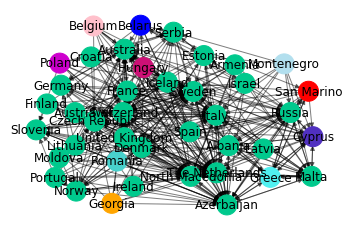

In [447]:
#edge(G_directed_2016_J)
#edge(G_directed_2017_J)
#edge(G_directed_2018_J)
# too many clusters
edge(G_directed_2019_J)

## k-clique

In [364]:
def find_community(graph,k):
    return list(community.k_clique_communities(graph,k))

def kclique(G):
  for k in range(2,10):
          print ("############# k-Clique: %d ################" % k)
          rst_com = find_community(G,k)
          print ("Count of Community being found：%d" % len(rst_com))
          print(rst_com)
          print(' ')
          colors = ["#00C98D", "#5030C0", "#50F0F0", 'red', 'blue', 'pink', "cyan", 'orange', '#CD1076', '#B2DFEE', '#CD00CD', '#48D1CC', '#D02090', '#EE9A49', '#60bba8', '#ed6925', '#edf8a3']
          pos = nx.spring_layout(G)
          lst_m = community.k_clique_communities(G, 2)
          color_map_b = {}
          keys = G.nodes()
          values = "black"
          for i in keys:
            color_map_b[i] = values
          counter = 0
          for c in lst_m:
            for n in c:
              color_map_b[n] = colors[counter]
            counter = counter + 1
          nx.draw_networkx_edges(G, pos, alpha = 0.5)
          nx.draw_networkx_nodes(G, pos, node_color=dict(color_map_b).values(), node_size = 400)
          nx.draw_networkx_labels(G, pos)
          plt.axis("off")
          plt.figure(figsize=(10, 8), dpi=80)
          plt.show()

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


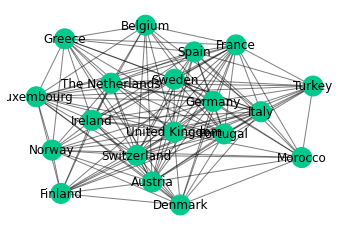

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


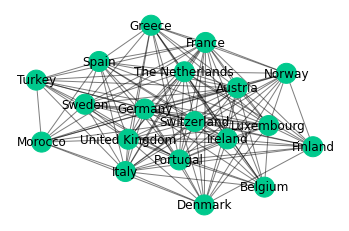

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


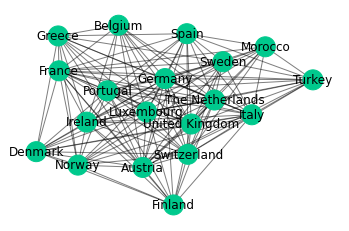

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


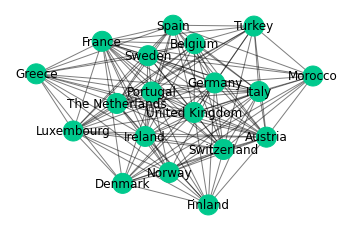

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


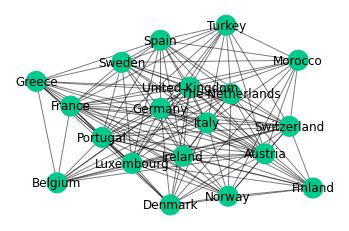

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


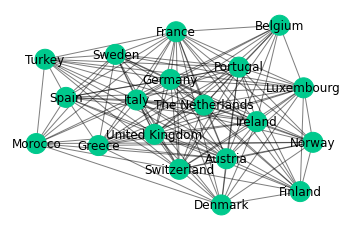

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


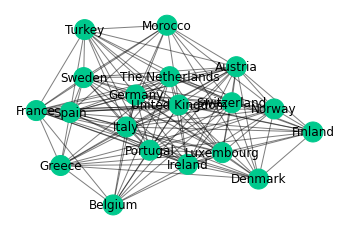

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Belgium', 'Spain', 'Denmark', 'Morocco', 'France', 'Switzerland'})]
 


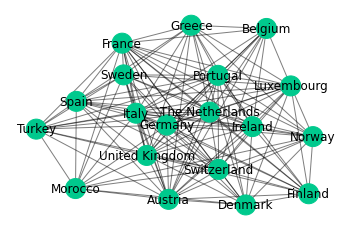

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


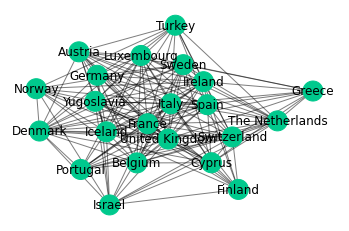

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


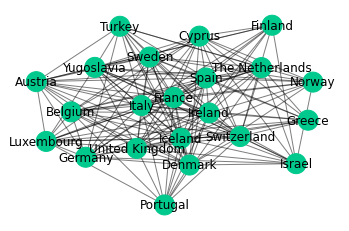

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


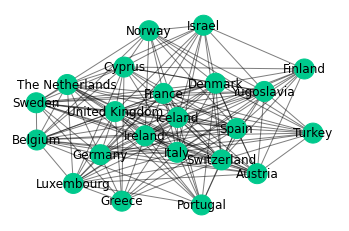

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


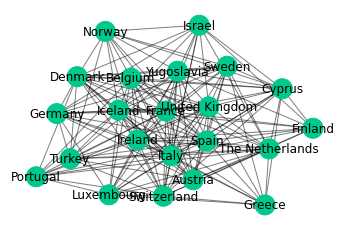

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


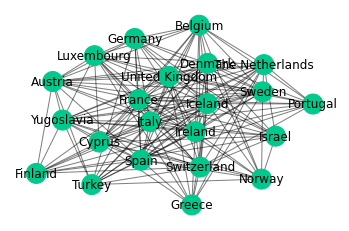

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Greece', 'Germany', 'Austria', 'Finland', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


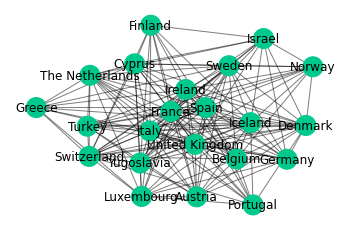

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Portugal', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'Cyprus', 'France', 'Switzerland'})]
 


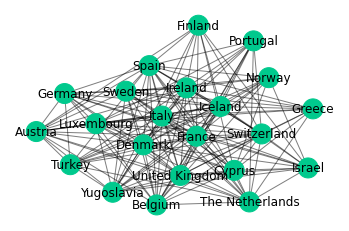

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Luxembourg', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Germany', 'Austria', 'Portugal', 'Spain', 'Denmark', 'Iceland', 'Yugoslavia', 'Belgium', 'France', 'Switzerland'})]
 


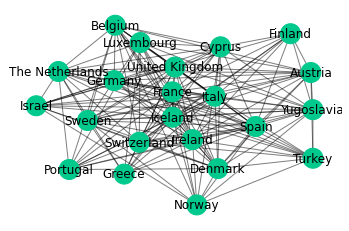

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Romania', 'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'F.Y.R. Macedonia', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'France', 'Estonia', 'Switzerland', 'Malta'})]
 


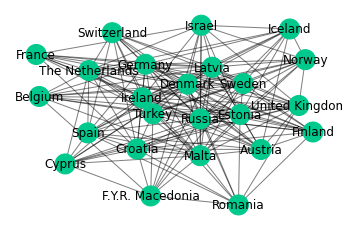

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Romania', 'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'F.Y.R. Macedonia', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'France', 'Estonia', 'Switzerland', 'Malta'})]
 


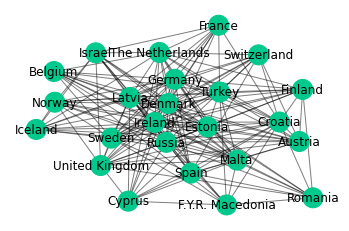

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Romania', 'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'F.Y.R. Macedonia', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'France', 'Estonia', 'Switzerland', 'Malta'})]
 


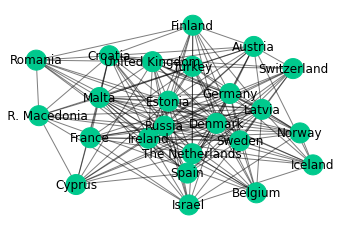

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Romania', 'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'F.Y.R. Macedonia', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'France', 'Estonia', 'Switzerland', 'Malta'})]
 


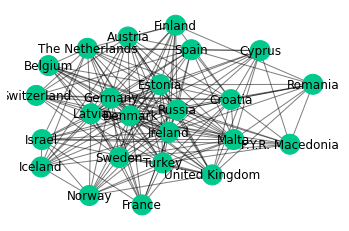

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Romania', 'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'F.Y.R. Macedonia', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'France', 'Estonia', 'Switzerland', 'Malta'})]
 


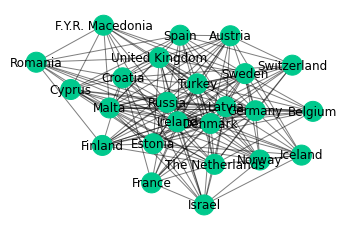

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'France', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'Romania', 'Estonia', 'Switzerland', 'Malta'})]
 


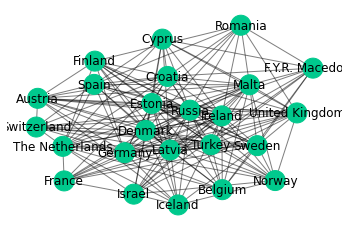

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'The Netherlands', 'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Finland', 'Germany', 'Austria', 'Croatia', 'Russia', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Cyprus', 'Estonia', 'Switzerland', 'Malta'})]
 


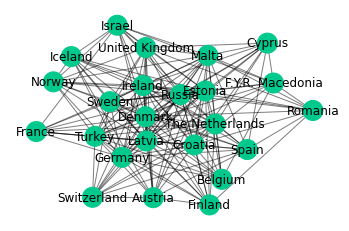

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'Norway', 'United Kingdom', 'Ireland', 'Sweden', 'Turkey', 'Germany', 'Austria', 'Russia', 'Israel', 'Denmark', 'Iceland', 'Latvia', 'Belgium', 'Estonia', 'Malta'})]
 


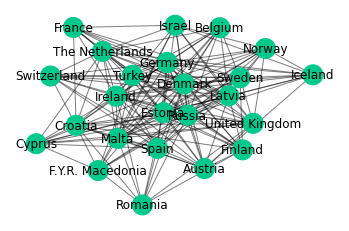

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Bulgaria', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'F.Y.R. Macedonia', 'Lithuania', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Slovakia', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


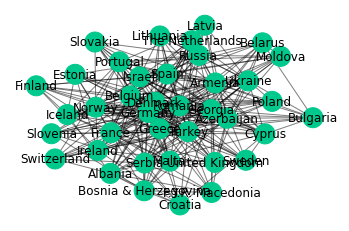

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Bulgaria', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'F.Y.R. Macedonia', 'Lithuania', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Slovakia', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


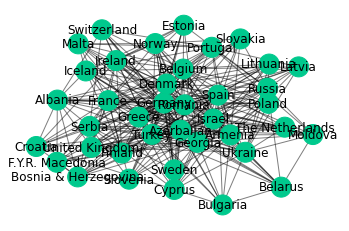

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Bulgaria', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'F.Y.R. Macedonia', 'Lithuania', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Slovakia', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


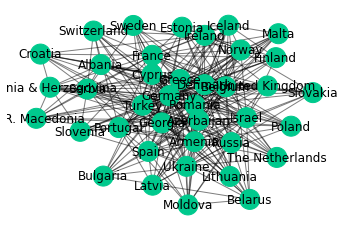

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Bulgaria', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'F.Y.R. Macedonia', 'Lithuania', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Slovakia', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


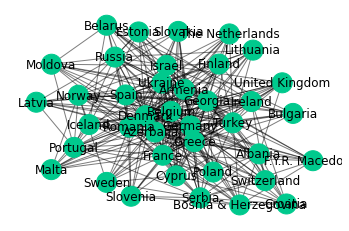

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Bulgaria', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Slovakia', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


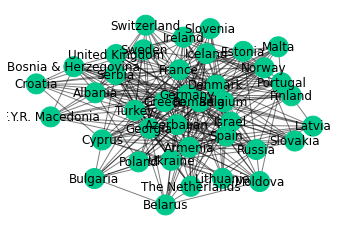

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：2
[frozenset({'Norway', 'Serbia', 'United Kingdom', 'Turkey', 'Greece', 'Germany', 'Finland', 'Portugal', 'Lithuania', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Malta', 'Armenia', 'The Netherlands', 'Slovakia', 'Georgia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'}), frozenset({'Armenia', 'Belarus', 'Russia', 'Ukraine', 'Israel', 'Spain', 'Azerbaijan', 'Georgia', 'Romania', 'Moldova'})]
 


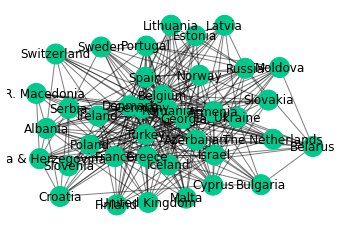

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：6
[frozenset({'Turkey', 'Armenia', 'Greece', 'Germany', 'The Netherlands', 'Ukraine', 'Belgium', 'Serbia', 'Romania'}), frozenset({'Armenia', 'Turkey', 'Germany', 'Portugal', 'Lithuania', 'Russia', 'Ukraine', 'Spain', 'Azerbaijan', 'Denmark', 'Latvia', 'Belgium', 'Romania'}), frozenset({'Romania', 'Germany', 'Portugal', 'Norway', 'Azerbaijan', 'Denmark', 'Iceland', 'Belgium', 'France', 'Malta'}), frozenset({'Turkey', 'Germany', 'Norway', 'Denmark', 'Estonia', 'Belgium', 'France', 'Ireland'}), frozenset({'Sweden', 'Turkey', 'Armenia', 'Germany', 'Norway', 'Denmark', 'Belgium', 'Romania'}), frozenset({'Turkey', 'Germany', 'Norway', 'Azerbaijan', 'Denmark', 'Belgium', 'Romania', 'Ireland'})]
 


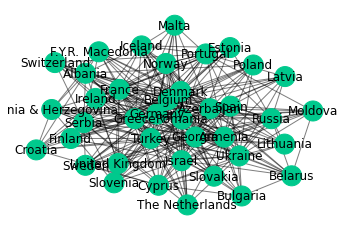

<Figure size 2400x480 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'Armenia', 'Germany', 'Portugal', 'Russia', 'Spain', 'Denmark', 'Latvia', 'Belgium', 'Romania'})]
 


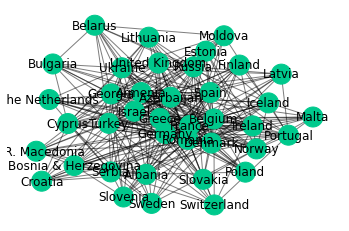

<Figure size 2400x480 with 0 Axes>

In [320]:
kclique(G_1980)
kclique(G_1990)
kclique(G_2000)
kclique(G_2010)

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


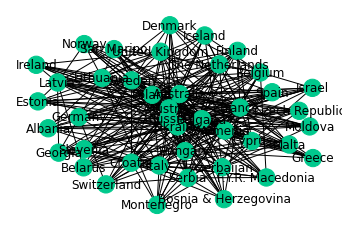

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


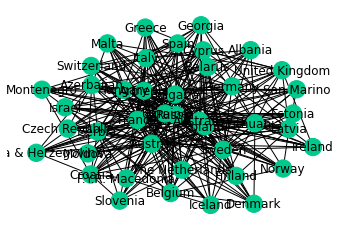

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


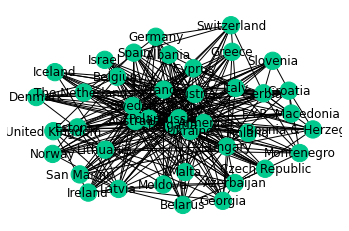

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


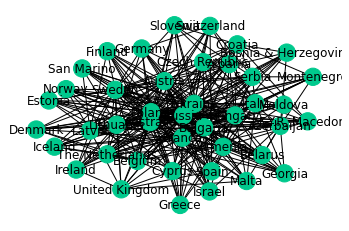

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


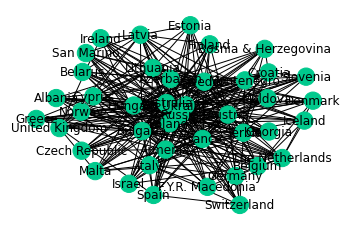

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


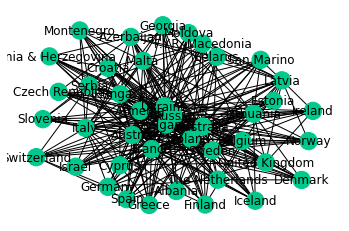

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'San Marino', 'Finland', 'Lithuania', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


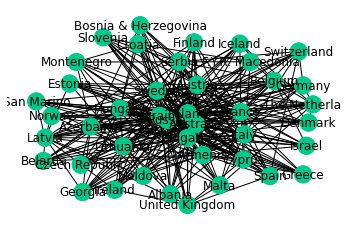

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Norway', 'Serbia', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Finland', 'Lithuania', 'Croatia', 'Israel', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Ireland', 'Sweden', 'Bosnia & Herzegovina', 'Russia', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium'})]
 


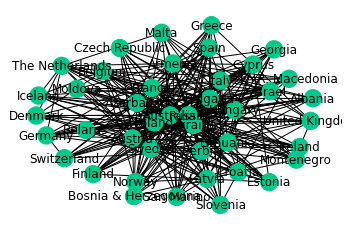

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


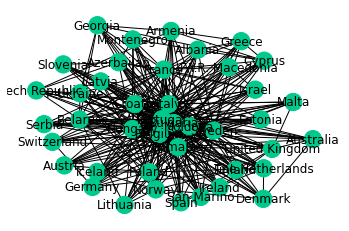

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


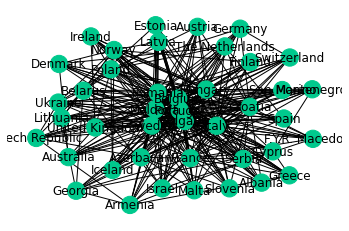

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


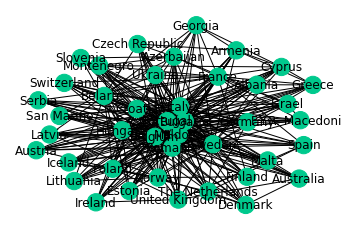

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


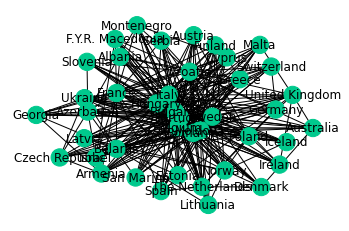

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


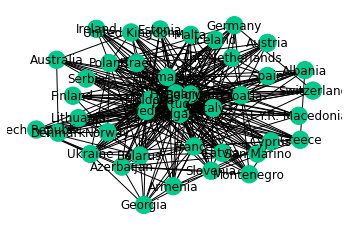

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


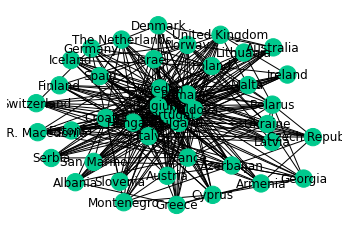

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Germany', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


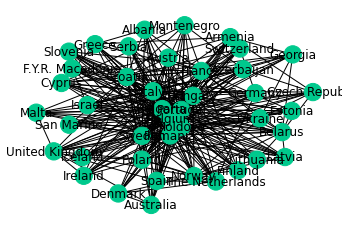

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Greece', 'Germany', 'Portugal', 'San Marino', 'F.Y.R. Macedonia', 'Croatia', 'Austria', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


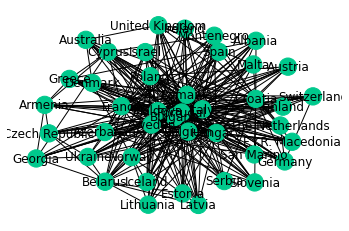

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


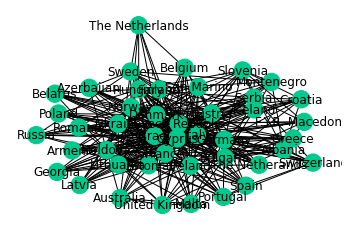

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


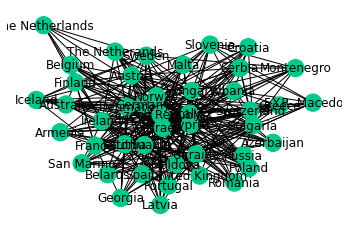

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


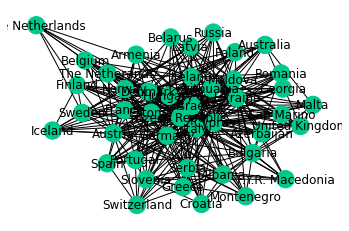

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


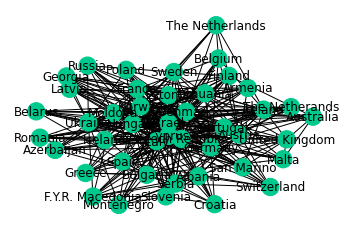

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


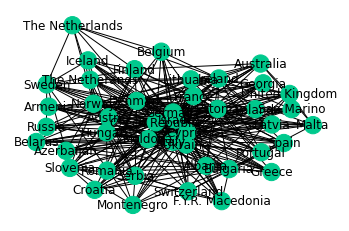

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'Finland', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


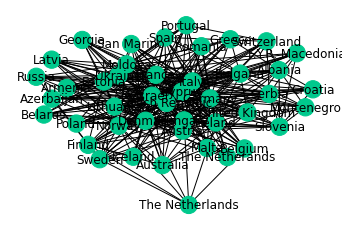

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Germany', 'Austria', 'Finland', 'San Marino', 'Lithuania', 'F.Y.R. Macedonia', 'Portugal', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'The Netherands', 'Russia', 'Ukraine', 'Denmark', 'Estonia', 'Belgium', 'Romania'})]
 


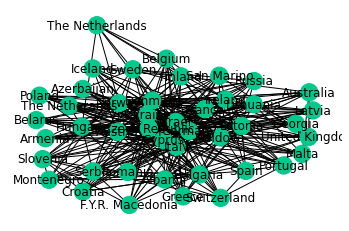

############# k-Clique: 9 ################
Count of Community being found：6
[frozenset({'Sweden', 'Germany', 'Austria', 'Czech Republic', 'Lithuania', 'Israel', 'Norway', 'Denmark', 'Iceland', 'Cyprus'}), frozenset({'Germany', 'Austria', 'Hungary', 'The Netherands', 'Czech Republic', 'Israel', 'Norway', 'Denmark', 'Cyprus', 'Italy'}), frozenset({'Bulgaria', 'Hungary', 'Belarus', 'Czech Republic', 'Moldova', 'Israel', 'Ukraine', 'Estonia', 'Cyprus', 'Italy'}), frozenset({'Finland', 'Austria', 'Hungary', 'Czech Republic', 'Israel', 'Denmark', 'Estonia', 'Cyprus', 'Italy'}), frozenset({'Latvia', 'Czech Republic', 'Lithuania', 'Israel', 'Ukraine', 'Denmark', 'Estonia', 'Cyprus', 'Italy'}), frozenset({'Lithuania', 'Israel', 'Ukraine', 'Georgia', 'Denmark', 'Estonia', 'France', 'Cyprus', 'Italy'})]
 


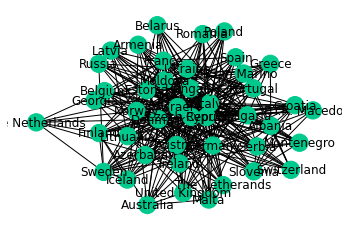

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Greece', 'Portugal', 'Lithuania', 'Croatia', 'Austria', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


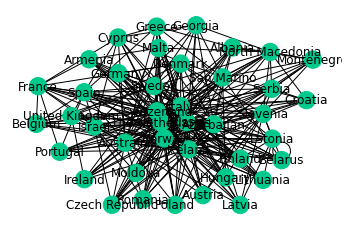

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Greece', 'Portugal', 'Lithuania', 'Croatia', 'Austria', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


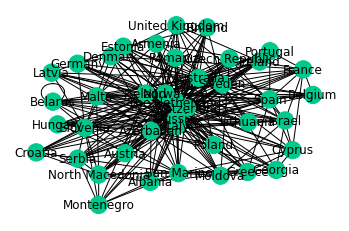

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Greece', 'Portugal', 'Lithuania', 'Croatia', 'Austria', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


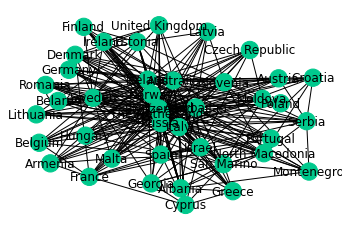

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Greece', 'Portugal', 'Lithuania', 'Croatia', 'Austria', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


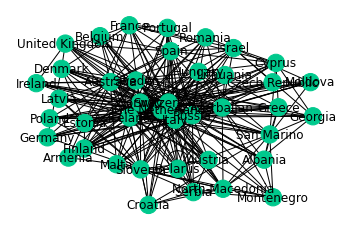

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Greece', 'Portugal', 'Lithuania', 'Croatia', 'Austria', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


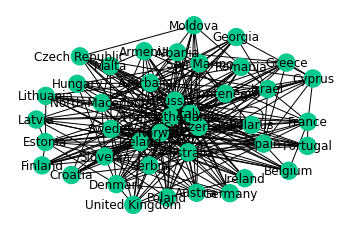

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Austria', 'Greece', 'Lithuania', 'Croatia', 'Portugal', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Ireland', 'Sweden', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


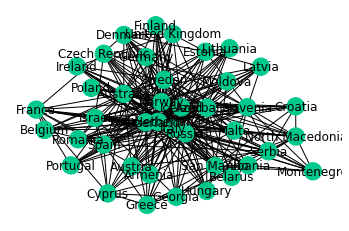

############# k-Clique: 8 ################
Count of Community being found：2
[frozenset({'Sweden', 'North Macedonia', 'The Netherlands', 'Norway', 'Azerbaijan', 'Italy', 'Switzerland', 'Malta'}), frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'San Marino', 'Austria', 'Portugal', 'Greece', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Ireland', 'Sweden', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


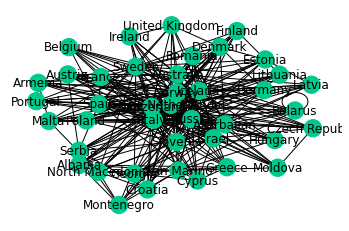

############# k-Clique: 9 ################
Count of Community being found：4
[frozenset({'Sweden', 'Australia', 'The Netherlands', 'Norway', 'Spain', 'Iceland', 'Belgium', 'Italy', 'Switzerland'}), frozenset({'Australia', 'The Netherlands', 'Norway', 'Italy', 'Portugal', 'Russia', 'Israel', 'Spain', 'Iceland', 'France', 'Cyprus', 'Switzerland'}), frozenset({'The Netherlands', 'Czech Republic', 'Russia', 'Moldova', 'Norway', 'Israel', 'Azerbaijan', 'Italy', 'Switzerland'}), frozenset({'Australia', 'Poland', 'The Netherlands', 'Belarus', 'Norway', 'Serbia', 'Slovenia', 'Italy', 'Germany', 'Austria', 'Russia', 'Denmark', 'Iceland', 'Switzerland'})]
 


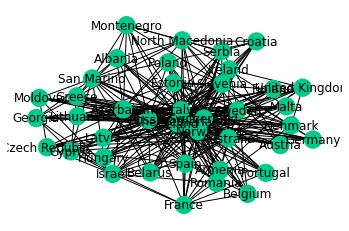

In [191]:
kclique(G_2016_T)
kclique(G_2017_T)
kclique(G_2018_T)
kclique(G_2019_T)

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Greece', 'San Marino', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


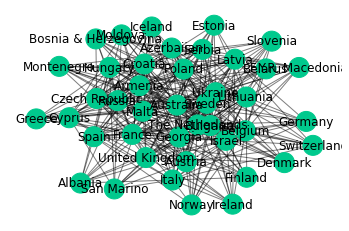

<Figure size 800x640 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Greece', 'San Marino', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


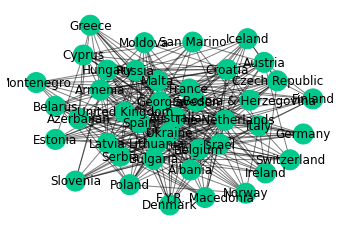

<Figure size 800x640 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Greece', 'San Marino', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


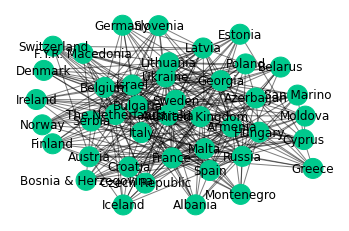

<Figure size 800x640 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Greece', 'San Marino', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


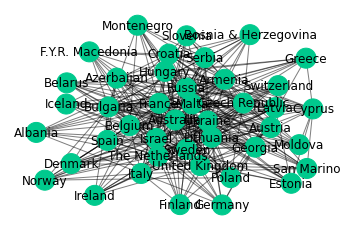

<Figure size 800x640 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Greece', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Bosnia & Herzegovina', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'})]
 


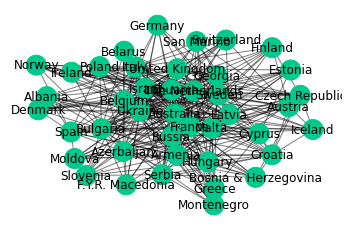

<Figure size 800x640 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：2
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Germany', 'Austria', 'Lithuania', 'F.Y.R. Macedonia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Georgia', 'Slovenia', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Belgium', 'Switzerland'}), frozenset({'Australia', 'Armenia', 'Greece', 'Hungary', 'Russia', 'Azerbaijan', 'France', 'Cyprus', 'Malta'})]
 


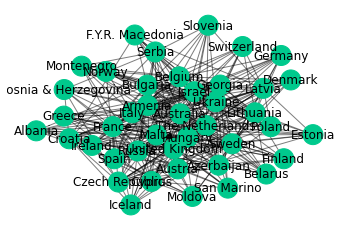

<Figure size 800x640 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：2
[frozenset({'Australia', 'Armenia', 'Bulgaria', 'Lithuania', 'Israel', 'Georgia', 'Belgium', 'France'}), frozenset({'Australia', 'Poland', 'Bulgaria', 'Lithuania', 'Israel', 'Ukraine', 'Georgia', 'Latvia'})]
 


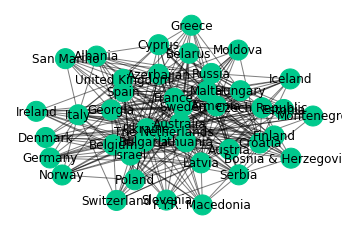

<Figure size 800x640 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：0
[]
 


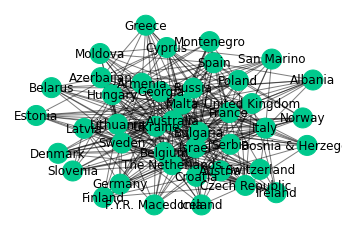

<Figure size 800x640 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Austria', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Germany', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


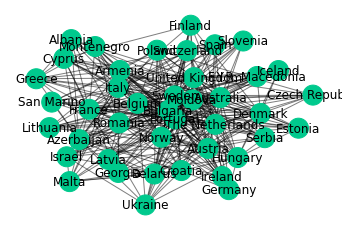

<Figure size 800x640 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Austria', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Germany', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


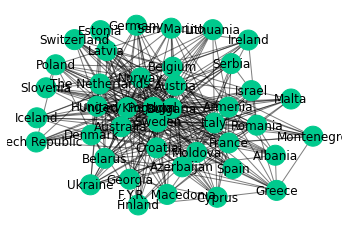

<Figure size 800x640 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Austria', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Germany', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


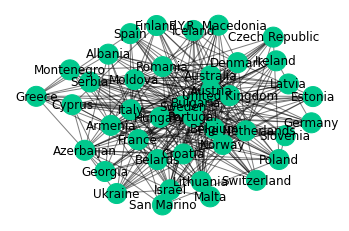

<Figure size 800x640 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'San Marino', 'Portugal', 'Austria', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Germany', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


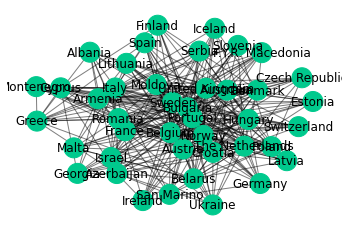

<Figure size 800x640 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：2
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'Israel', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'}), frozenset({'Bulgaria', 'Portugal', 'Belarus', 'Ukraine', 'Israel', 'Azerbaijan', 'Moldova'})]
 


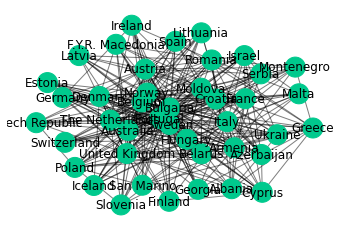

<Figure size 800x640 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'Israel', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


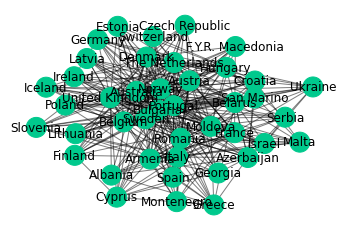

<Figure size 800x640 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'F.Y.R. Macedonia', 'Croatia', 'Lithuania', 'Iceland', 'Latvia', 'France', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Slovenia', 'Sweden', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


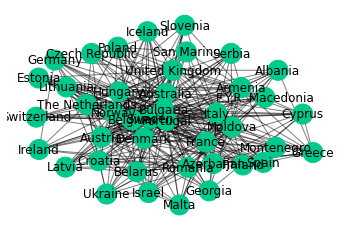

<Figure size 800x640 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：1
[frozenset({'Australia', 'Armenia', 'Bulgaria', 'The Netherlands', 'Hungary', 'Belarus', 'Norway', 'Moldova', 'United Kingdom', 'Sweden', 'Germany', 'Austria', 'Portugal', 'Croatia', 'Denmark', 'Estonia', 'Belgium', 'France'})]
 


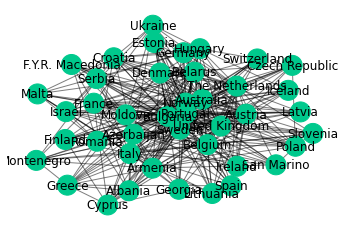

<Figure size 800x640 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'Austria', 'Portugal', 'Germany', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'San Marino', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


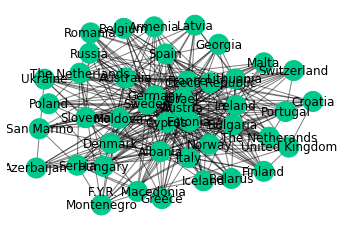

<Figure size 800x640 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'Austria', 'Portugal', 'Germany', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'San Marino', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


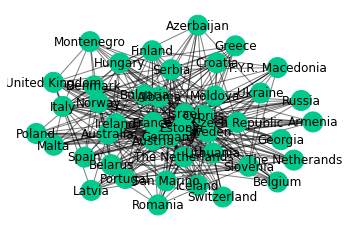

<Figure size 800x640 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Greece', 'Finland', 'Austria', 'Portugal', 'Germany', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'San Marino', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


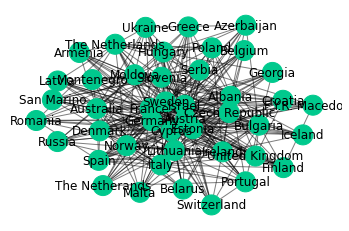

<Figure size 800x640 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'San Marino', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


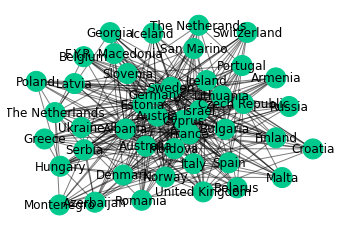

<Figure size 800x640 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'San Marino', 'Lithuania', 'F.Y.R. Macedonia', 'Croatia', 'Greece', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


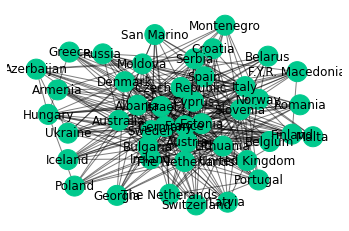

<Figure size 800x640 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：2
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Lithuania', 'Croatia', 'Israel', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Poland', 'Armenia', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Switzerland'}), frozenset({'Norway', 'Serbia', 'Germany', 'Austria', 'Estonia', 'The Netherlands', 'Moldova'})]
 


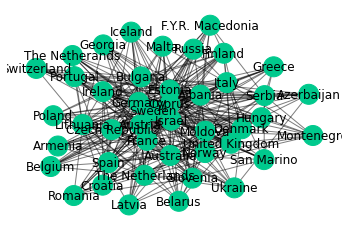

<Figure size 800x640 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：1
[frozenset({'Australia', 'Bulgaria', 'Hungary', 'Czech Republic', 'Norway', 'Italy', 'United Kingdom', 'Ireland', 'Sweden', 'Finland', 'Germany', 'Austria', 'The Netherands', 'Lithuania', 'Albania', 'Israel', 'Spain', 'Denmark', 'Iceland', 'Estonia', 'France', 'Cyprus', 'Switzerland'})]
 


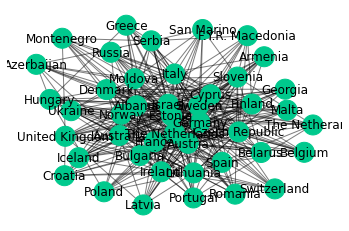

<Figure size 800x640 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：2
[frozenset({'Sweden', 'Germany', 'Austria', 'Norway', 'Spain', 'Estonia', 'Cyprus', 'Italy', 'Ireland'}), frozenset({'Sweden', 'Germany', 'Austria', 'Bulgaria', 'Lithuania', 'Estonia', 'Cyprus', 'Switzerland', 'Ireland'})]
 


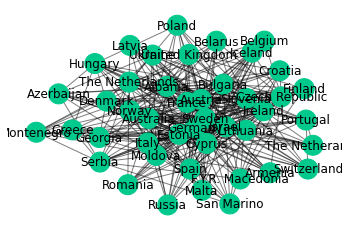

<Figure size 800x640 with 0 Axes>

############# k-Clique: 2 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'San Marino', 'Croatia', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


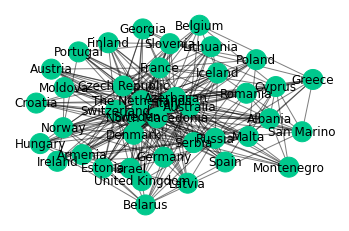

<Figure size 800x640 with 0 Axes>

############# k-Clique: 3 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'San Marino', 'Croatia', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


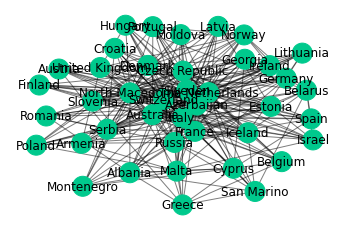

<Figure size 800x640 with 0 Axes>

############# k-Clique: 4 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'San Marino', 'Croatia', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


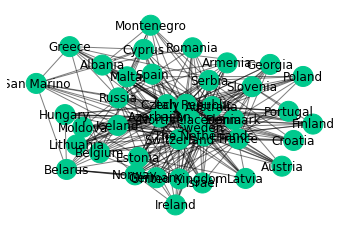

<Figure size 800x640 with 0 Axes>

############# k-Clique: 5 ################
Count of Community being found：1
[frozenset({'Australia', 'Hungary', 'Norway', 'Serbia', 'Italy', 'Moldova', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'San Marino', 'Croatia', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'})]
 


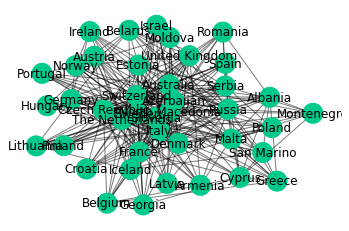

<Figure size 800x640 with 0 Axes>

############# k-Clique: 6 ################
Count of Community being found：2
[frozenset({'Australia', 'Norway', 'Serbia', 'Italy', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Lithuania', 'San Marino', 'Croatia', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Russia', 'Albania', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'}), frozenset({'Sweden', 'Armenia', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Italy', 'Malta'})]
 


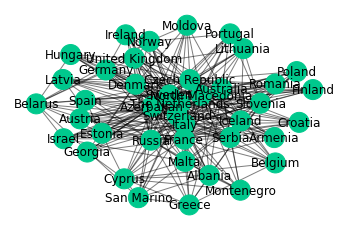

<Figure size 800x640 with 0 Axes>

############# k-Clique: 7 ################
Count of Community being found：2
[frozenset({'Sweden', 'Germany', 'North Macedonia', 'The Netherlands', 'Norway', 'Denmark', 'Italy', 'Switzerland'}), frozenset({'Australia', 'North Macedonia', 'The Netherlands', 'Czech Republic', 'Serbia', 'Italy', 'Sweden', 'Germany', 'Lithuania', 'Israel', 'Azerbaijan', 'Iceland', 'Estonia', 'Belgium', 'France', 'Switzerland'})]
 


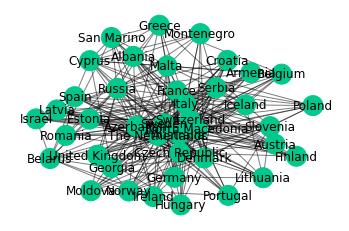

<Figure size 800x640 with 0 Axes>

############# k-Clique: 8 ################
Count of Community being found：0
[]
 


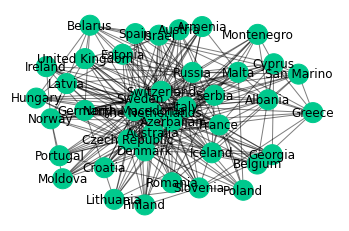

<Figure size 800x640 with 0 Axes>

############# k-Clique: 9 ################
Count of Community being found：0
[]
 


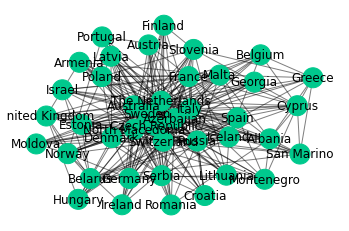

<Figure size 800x640 with 0 Axes>

In [448]:
kclique(G_2016_J)
kclique(G_2017_J)
kclique(G_2018_J)
kclique(G_2019_J)

## Maximum modulaty

In [449]:
def modular(graph):
  community.greedy_modularity_communities(graph)

  colors = ["#00C98D", "#5030C0", "#50F0F0", 'red', 'blue', 'pink', 'orange', '#CD1076', '#B2DFEE', '#CD00CD', '#48D1CC', '#D02090', '#EE9A49', '#60bba8', '#ed6925', '#edf8a3']
  pos = nx.spring_layout(graph)
  lst_b = community.greedy_modularity_communities(graph)
  color_map_b = {}
  keys = graph.nodes()
  values = "black"
  for i in keys:
          color_map_b[i] = values
  counter = 0
  for x in lst_b:
    for n in x:
      color_map_b[n] = colors[counter]
    counter = counter + 1

  nx.draw_networkx_edges(graph, pos, alpha = 0.5)
  nx.draw_networkx_nodes(graph, pos, node_color=dict(color_map_b).values(), node_size = 400)
  nx.draw_networkx_labels(graph, pos)
  plt.axis("off")
  plt.show()

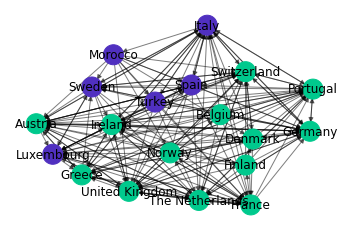

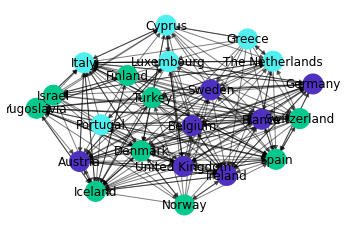

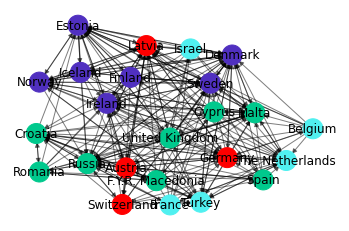

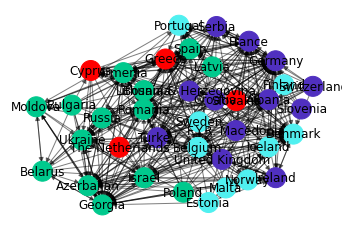

In [450]:
modular(G_directed_1980)
modular(G_directed_1990)
modular(G_directed_2000)
modular(G_directed_2010)

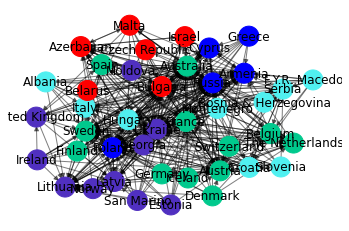

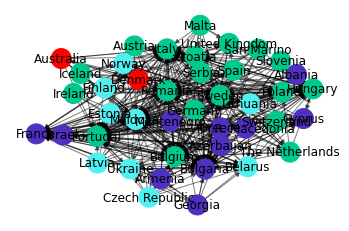

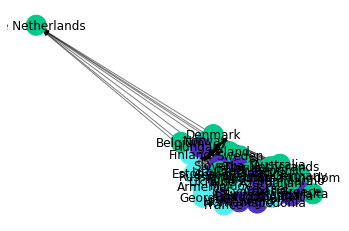

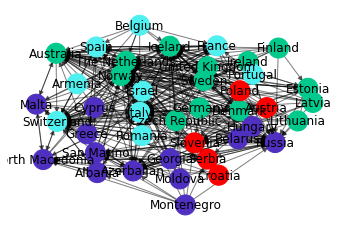

In [451]:
modular(G_directed_2016_T)
modular(G_directed_2017_T)
modular(G_directed_2018_T)
modular(G_directed_2019_T)

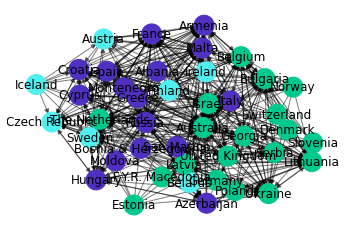

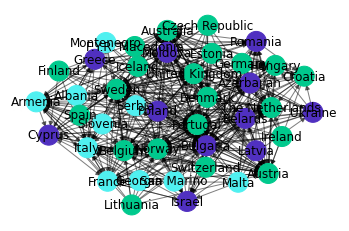

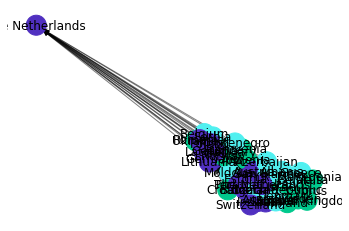

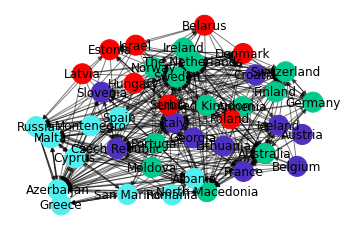

In [452]:
modular(G_directed_2016_J)
modular(G_directed_2017_J)
modular(G_directed_2018_J)
modular(G_directed_2019_J)

## Label propagation

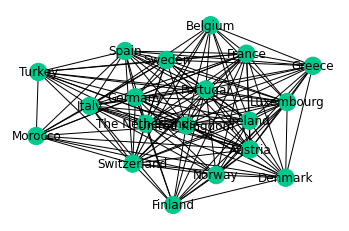

In [238]:
def label(graph):

  colors = ["#00C98D", "#5030C0", "#50F0F0", 'red', 'blue', 'pink', 'orange', '#CD1076', '#B2DFEE', '#CD00CD', '#48D1CC', '#D02090', '#EE9A49', '#60bba8', '#ed6925', '#edf8a3']
  pos = nx.spring_layout(graph)
  lst_m = community.label_propagation_communities(graph)
  color_map_b = {}
  keys = graph.nodes()
  values = "black"
  for i in keys:
    color_map_b[i] = values
  counter = 0
  for c in lst_m:
    for n in c:
      color_map_b[n] = colors[counter]
    counter = counter + 1
  nx.draw_networkx_edges(graph, pos, alpha = 0.5)
  nx.draw_networkx_nodes(graph, pos, node_color=dict(color_map_b).values(), node_size = 400)
  nx.draw_networkx_labels(graph, pos)
  plt.axis("off")
  plt.show()

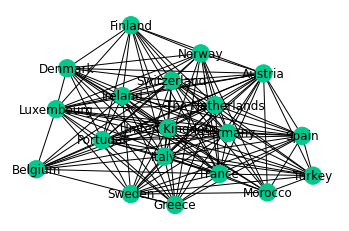

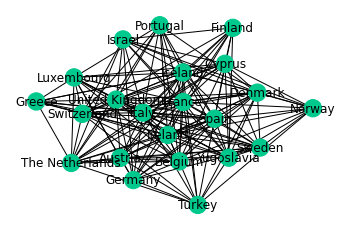

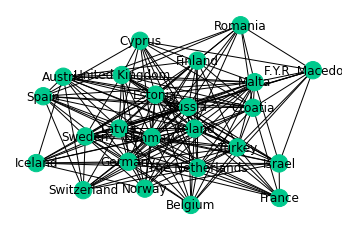

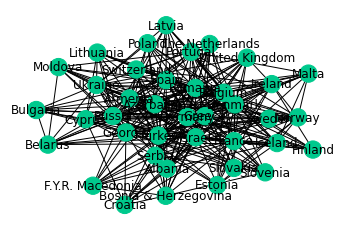

In [214]:
label(G_1980)
label(G_1990)
label(G_2000)
label(G_2010)

In [237]:
label(G_2016_T)
label(G_2017_T)
label(G_2018_T)
label(G_2019_T)

dict_values([{'Australia', 'Bulgaria', 'Hungary', 'Belarus', 'Norway', 'Serbia', 'Moldova', 'Italy', 'United Kingdom', 'Finland', 'Germany', 'Austria', 'Portugal', 'Greece', 'Lithuania', 'Croatia', 'F.Y.R. Macedonia', 'San Marino', 'Israel', 'Azerbaijan', 'Iceland', 'Latvia', 'France', 'Cyprus', 'Malta', 'Armenia', 'Poland', 'The Netherlands', 'Czech Republic', 'Georgia', 'Slovenia', 'Ireland', 'Sweden', 'Montenegro', 'The Netherands', 'Russia', 'Albania', 'Ukraine', 'Spain', 'Denmark', 'Estonia', 'Belgium', 'Romania', 'Switzerland'}])

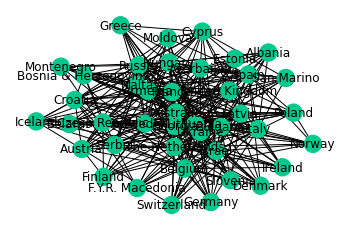

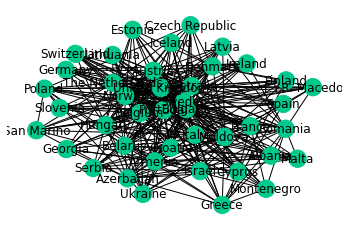

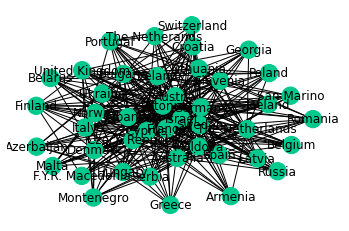

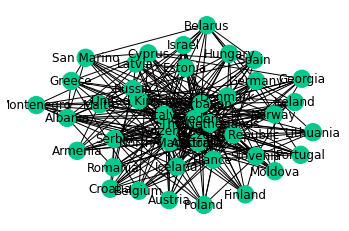

In [152]:
label(G_2016_J)
label(G_2017_J)
label(G_2018_J)
label(G_2019_J)

## Louvian

In [280]:
def louv(graph):
  colors = ["#00C98D", "#5030C0", "#50F0F0", 'red', 'blue', 'pink', 'orange', '#CD1076', '#B2DFEE', '#CD00CD', '#48D1CC', '#D02090', '#EE9A49', '#60bba8', '#ed6925', '#edf8a3']
  pos = nx.spring_layout(graph)
  lst_m = community_louvain.best_partition(graph)
  color_map_b = {}
  keys = graph.nodes()
  values = "black"
  for i in keys:
          color_map_b[i] = values

  for n in dict(lst_m):
    color_map_b[n] = colors[lst_m[n]]

  nx.draw_networkx_edges(graph, pos, alpha = 0.5)
  nx.draw_networkx_nodes(graph, pos, node_color=dict(color_map_b).values(), node_size = 400)
  nx.draw_networkx_labels(graph, pos, font_color = 'k')
  plt.axis("off")
  plt.show()



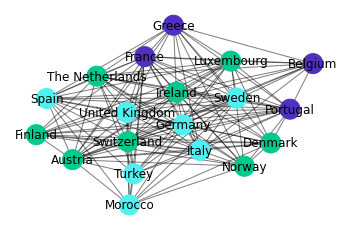

{'Austria': 0, 'Germany': 2, 'Greece': 1, 'Ireland': 0, 'Italy': 2, 'Luxembourg': 1, 'Spain': 2, 'Switzerland': 0, 'The Netherlands': 1, 'Turkey': 2, 'United Kingdom': 2, 'Belgium': 1, 'France': 1, 'Portugal': 1, 'Denmark': 0, 'Finland': 0, 'Norway': 0, 'Sweden': 2, 'Morocco': 2}


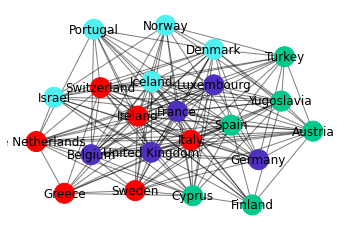

{'Austria': 1, 'Belgium': 0, 'Denmark': 1, 'France': 0, 'Germany': 0, 'Iceland': 0, 'Ireland': 0, 'Italy': 1, 'Luxembourg': 0, 'Spain': 1, 'United Kingdom': 0, 'Cyprus': 1, 'Greece': 1, 'Switzerland': 1, 'The Netherlands': 0, 'Yugoslavia': 1, 'Norway': 0, 'Finland': 1, 'Israel': 0, 'Sweden': 0, 'Turkey': 1, 'Portugal': 1}


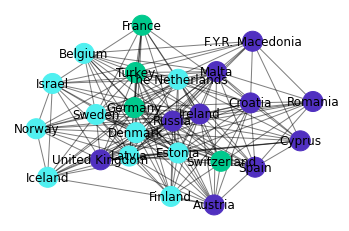

{'Austria': 0, 'Croatia': 1, 'Denmark': 0, 'Estonia': 1, 'Germany': 0, 'Ireland': 1, 'Latvia': 0, 'Malta': 1, 'Russia': 1, 'Switzerland': 0, 'Turkey': 2, 'Belgium': 0, 'Sweden': 2, 'The Netherlands': 0, 'Cyprus': 1, 'F.Y.R. Macedonia': 1, 'Romania': 1, 'United Kingdom': 1, 'Spain': 0, 'Iceland': 2, 'Norway': 2, 'Finland': 0, 'Israel': 2, 'France': 2}


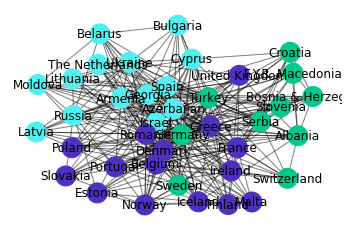

{'Albania': 0, 'Bosnia & Herzegovina': 0, 'Denmark': 2, 'Germany': 2, 'Greece': 2, 'Israel': 1, 'Romania': 2, 'Serbia': 0, 'Spain': 1, 'Turkey': 0, 'United Kingdom': 2, 'Armenia': 1, 'France': 2, 'Georgia': 1, 'Norway': 2, 'Portugal': 2, 'Russia': 1, 'Ukraine': 1, 'Azerbaijan': 1, 'Moldova': 1, 'Belarus': 1, 'Iceland': 2, 'Belgium': 2, 'Bulgaria': 1, 'Cyprus': 1, 'Croatia': 0, 'Ireland': 2, 'Estonia': 2, 'F.Y.R. Macedonia': 0, 'Finland': 2, 'Latvia': 2, 'Lithuania': 1, 'Malta': 2, 'Poland': 2, 'Slovakia': 2, 'Slovenia': 0, 'Sweden': 2, 'Switzerland': 0, 'The Netherlands': 1}


In [281]:
louv(G_1980)
print(community_louvain.best_partition(G_1980))

louv(G_1990)
print(community_louvain.best_partition(G_1990))

louv(G_2000)
print(community_louvain.best_partition(G_2000))

louv(G_2010)
print(community_louvain.best_partition(G_2010))

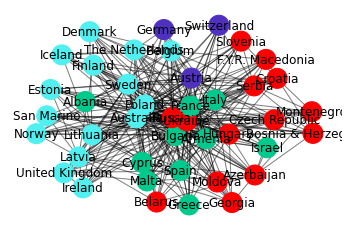

{'Albania': 1, 'Armenia': 1, 'Australia': 0, 'Bulgaria': 1, 'Hungary': 3, 'Italy': 1, 'Lithuania': 0, 'Poland': 0, 'Russia': 3, 'Sweden': 0, 'Ukraine': 3, 'Austria': 2, 'Cyprus': 1, 'France': 1, 'Georgia': 3, 'Malta': 3, 'Belgium': 0, 'Spain': 1, 'United Kingdom': 0, 'Germany': 2, 'Serbia': 3, 'The Netherlands': 0, 'Azerbaijan': 3, 'Israel': 1, 'Belarus': 3, 'Latvia': 0, 'Bosnia & Herzegovina': 3, 'Croatia': 3, 'Czech Republic': 3, 'Denmark': 0, 'Estonia': 0, 'F.Y.R. Macedonia': 3, 'Finland': 0, 'Greece': 1, 'Iceland': 0, 'Ireland': 0, 'Moldova': 3, 'Montenegro': 3, 'Norway': 0, 'San Marino': 0, 'Slovenia': 3, 'Switzerland': 2}


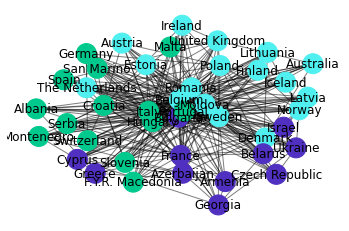

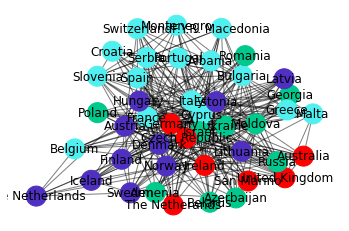

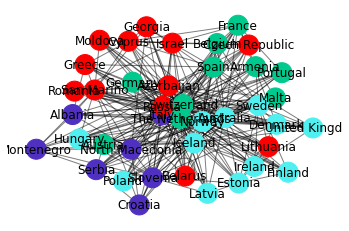

{'Albania': 1,
 'Armenia': 0,
 'Australia': 2,
 'Austria': 0,
 'Azerbaijan': 3,
 'Belarus': 0,
 'Belgium': 0,
 'Croatia': 1,
 'Cyprus': 3,
 'Czech Republic': 3,
 'Denmark': 2,
 'Estonia': 2,
 'Finland': 2,
 'France': 0,
 'Georgia': 3,
 'Germany': 2,
 'Greece': 1,
 'Hungary': 2,
 'Iceland': 2,
 'Ireland': 2,
 'Israel': 3,
 'Italy': 1,
 'Latvia': 2,
 'Lithuania': 3,
 'Malta': 0,
 'Moldova': 3,
 'Montenegro': 1,
 'North Macedonia': 1,
 'Norway': 2,
 'Poland': 2,
 'Portugal': 0,
 'Romania': 3,
 'Russia': 3,
 'San Marino': 1,
 'Serbia': 1,
 'Slovenia': 1,
 'Spain': 0,
 'Sweden': 2,
 'Switzerland': 0,
 'The Netherlands': 0,
 'United Kingdom': 2}

In [282]:
louv(G_2016_T)
print(community_louvain.best_partition(G_2016_T))

louv(G_2017_T)
community_louvain.best_partition(G_2017_T)

louv(G_2018_T)
community_louvain.best_partition(G_2018_T)

louv(G_2019_T)
community_louvain.best_partition(G_2019_T)

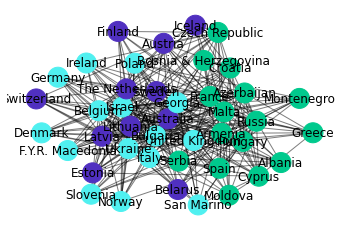

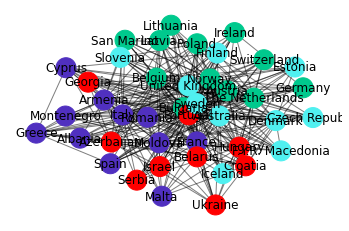

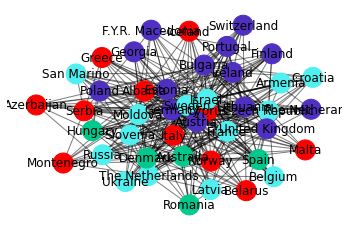

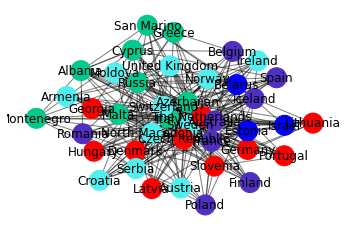

{'Albania': 0,
 'Armenia': 4,
 'Australia': 1,
 'Austria': 4,
 'Azerbaijan': 2,
 'Belarus': 3,
 'Belgium': 1,
 'Croatia': 4,
 'Cyprus': 0,
 'Czech Republic': 2,
 'Denmark': 4,
 'Estonia': 3,
 'Finland': 1,
 'France': 1,
 'Georgia': 2,
 'Germany': 4,
 'Greece': 0,
 'Hungary': 2,
 'Iceland': 1,
 'Ireland': 4,
 'Israel': 3,
 'Italy': 0,
 'Latvia': 4,
 'Lithuania': 2,
 'Malta': 0,
 'Moldova': 4,
 'Montenegro': 0,
 'North Macedonia': 4,
 'Norway': 4,
 'Poland': 1,
 'Portugal': 2,
 'Romania': 2,
 'Russia': 0,
 'San Marino': 0,
 'Serbia': 1,
 'Slovenia': 2,
 'Spain': 1,
 'Sweden': 1,
 'Switzerland': 4,
 'The Netherlands': 4,
 'United Kingdom': 4}

In [283]:
louv(G_2016_J)
community_louvain.best_partition(G_2016_J)

louv(G_2017_J)
community_louvain.best_partition(G_2017_J)

louv(G_2018_J)
community_louvain.best_partition(G_2018_J)

louv(G_2019_J)
community_louvain.best_partition(G_2019_J)

# Link prediction

In [392]:
def link_pr(graph):
  neig = list(nx.jaccard_coefficient(graph))

  r = []
  for i in neig:
      r.append(i[2])

  df = DataFrame(neig)
  df2 = df.sort_values(2)
  print('Link prediction for', namestr(graph, globals())[0])
  print(df2)
  print('')

In [393]:
link_pr(G_1980)
link_pr(G_1990)
link_pr(G_2000)
link_pr(G_2010)

Link prediction for G_1990
             0           1         2
7       Norway      Greece  0.312500
3   Luxembourg      Norway  0.315789
30      Greece      Israel  0.375000
11      Norway    Portugal  0.375000
20      Turkey      Greece  0.375000
..         ...         ...       ...
58     Iceland      Cyprus  0.700000
59      Cyprus     Ireland  0.700000
37     Germany  Yugoslavia  0.705882
0   Luxembourg      Sweden  0.705882
5   Luxembourg       Spain  0.736842

[64 rows x 3 columns]

Link prediction for G_2000
                   0                 1         2
50  F.Y.R. Macedonia           Iceland  0.235294
71           Iceland           Romania  0.235294
79            France           Romania  0.250000
42           Austria  F.Y.R. Macedonia  0.263158
66            Israel       Switzerland  0.277778
..               ...               ...       ...
23            Turkey            Latvia  0.714286
39           Austria            Sweden  0.722222
80            France       Switzerlan

In [182]:
link_pr(G_2016_T)
link_pr(G_2017_T)
link_pr(G_2018_T)
link_pr(G_2019_T)

Link prediction for G_2016_T
              0                 1         2
116       Italy           Iceland  0.166667
277   Lithuania  F.Y.R. Macedonia  0.185185
117       Italy            Latvia  0.200000
95       Serbia            Latvia  0.206897
421     Armenia           Ireland  0.206897
..          ...               ...       ...
196     Finland           Estonia  0.818182
362     Iceland           Denmark  0.818182
44      Belarus    Czech Republic  0.818182
34      Belarus        San Marino  0.818182
268  San Marino           Albania  0.818182

[502 rows x 3 columns]

Link prediction for G_2017_T
                  0          1         2
224         Germany    Georgia  0.166667
263         Croatia    Georgia  0.166667
458         Georgia    Ireland  0.176471
453         Georgia    Denmark  0.176471
130  United Kingdom    Georgia  0.200000
..              ...        ...       ...
409           Malta    Ireland  0.818182
167         Finland  Lithuania  0.818182
326          Israel 

In [183]:
link_pr(G_2016_J)
link_pr(G_2017_J)
link_pr(G_2018_J)
link_pr(G_2019_J)

Link prediction for G_2016_J
                    0                 1         2
256            Greece           Ireland  0.052632
155           Moldova           Ireland  0.052632
275        San Marino            Poland  0.095238
92             Norway            Russia  0.096774
268        San Marino  F.Y.R. Macedonia  0.111111
..                ...               ...       ...
290         Lithuania   The Netherlands  0.625000
96             Norway       Switzerland  0.666667
94             Norway           Denmark  0.666667
325  F.Y.R. Macedonia          Slovenia  0.666667
227           Germany       Switzerland  0.666667

[506 rows x 3 columns]

Link prediction for G_2017_J
             0               1         2
400      Malta  Czech Republic  0.111111
138     Greece         Germany  0.142857
158     Greece         Estonia  0.150000
160     Greece     Switzerland  0.150000
113      Italy         Germany  0.161290
..         ...             ...       ...
495    Estonia     Switzerland